# Project description

In this project, we aim to characterise the effect of Foxa2 in the determination of endoderm and mesoderm lineages in the mouse embryo.

**In this notebook:** Clustering and annotation of the data. 

# Initialisation

In [1]:
import numpy as np
import scipy as sci
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as pl

import scanpy as sc
import anndata as ann
import gseapy as gp
import scvelo as scv

from scipy.sparse import csr_matrix
from matplotlib import rcParams
from matplotlib import colors
from seaborn import heatmap
from matplotlib import gridspec

import os

sc.settings.verbosity = 3
sc.logging.print_versions()

scanpy==1.4.5.2.dev6+gfa408dc7 anndata==0.7.1 umap==0.3.10 numpy==1.17.4 scipy==1.3.1 pandas==0.25.2 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [2]:
import matplotlib
matplotlib.__version__

'3.1.3'

In [3]:
import datetime

today = datetime.date.today().strftime('%y%m%d')

In [4]:
#%matplotlib inline
#%config InlineBackend.figure_format='retina' # mac

sc.settings.set_figure_params(dpi=70)
sc.settings.verbosity = 3
sc.settings.n_jobs = 3

data_dir = '/Users/maren.buettner/Documents/Collaborations/Engert_Schirge_IDR/data/'

In [5]:
sc.set_figure_params(vector_friendly=True,color_map='viridis',dpi_save=600,transparent=True)


# Load dataset

We load a batch corrected data set, which has the logCPM-normalized, but non-corrected data matrix as `raw`.

In [6]:
adata_cor = sc.read(filename='./adata_batch_corrected.h5ad')


Summarise batch info to 'FVF_neg', 'FVF_low', 'FVF_high'.

In [7]:
adata_cor.obs['FVF'] = adata_cor.obs['batch'].cat.add_categories(['FVF_neg', 'FVF_low', 'FVF_high'])
adata_cor.obs['FVF'][np.in1d(adata_cor.obs['FVF'], ['fvf_neg_1', 'fvf_neg_2'])] = 'FVF_neg'
adata_cor.obs['FVF'][np.in1d(adata_cor.obs['FVF'], ['fvf_low_1', 'fvf_low_2', 'fvf_low_3'])] = 'FVF_low'
adata_cor.obs['FVF'][np.in1d(adata_cor.obs['FVF'], ['fvf_high_1', 'fvf_high_2', 'fvf_high_3'])] = 'FVF_high'
adata_cor.obs['FVF'] = adata_cor.obs['FVF'].cat.remove_unused_categories()

Add my color scheme.

In [8]:
colors2 = pl.cm.RdYlBu_r(np.linspace(0, 1, 128))
colors3 = pl.cm.Greys_r(0.7)
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [9]:
colors2 = pl.cm.Reds(np.linspace(0, 1, 128))
colors3 = pl.cm.Greys_r(0.7)
colorsComb = np.vstack([colors3, colors2])
mymap2 = colors.LinearSegmentedColormap.from_list('my_colormap2', colorsComb)

# Clustering

In [10]:
sc.pp.pca(adata_cor)
sc.pp.neighbors(adata_cor)

computing PCA with n_comps = 50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:08)


In [11]:
sc.tl.louvain(adata_cor, resolution=2)


running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 27 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:01)


In [12]:
adata_cor.obs['louvain'].value_counts()

0     679
1     648
2     619
3     570
4     553
5     471
6     453
7     442
8     425
9     405
10    402
11    398
12    389
13    381
14    352
15    351
16    329
17    282
18    279
19    278
20    241
21    232
22    223
23    161
24    123
25     87
26     21
Name: louvain, dtype: int64

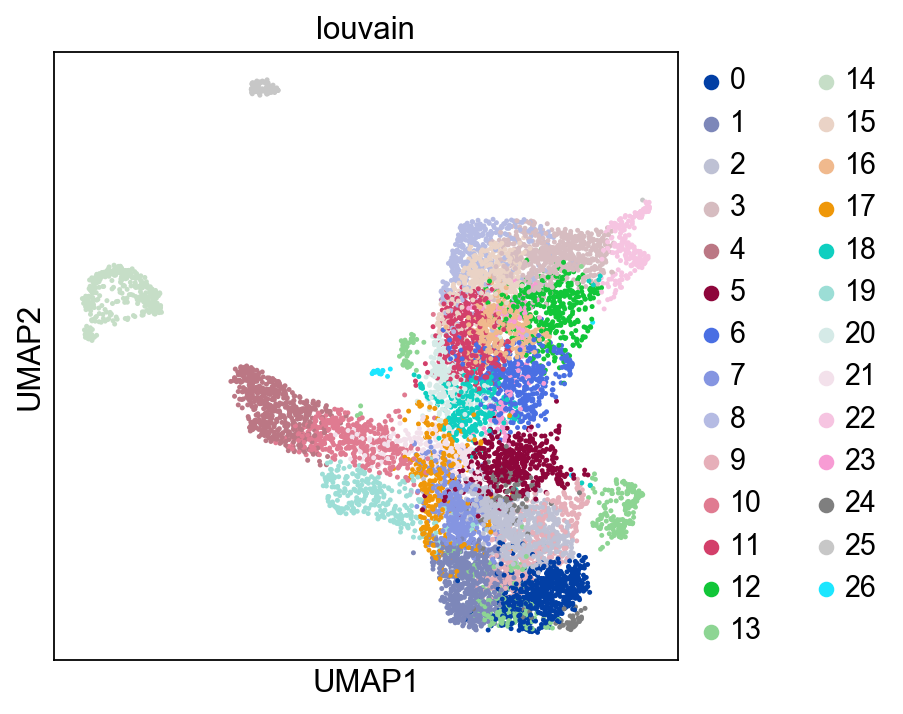

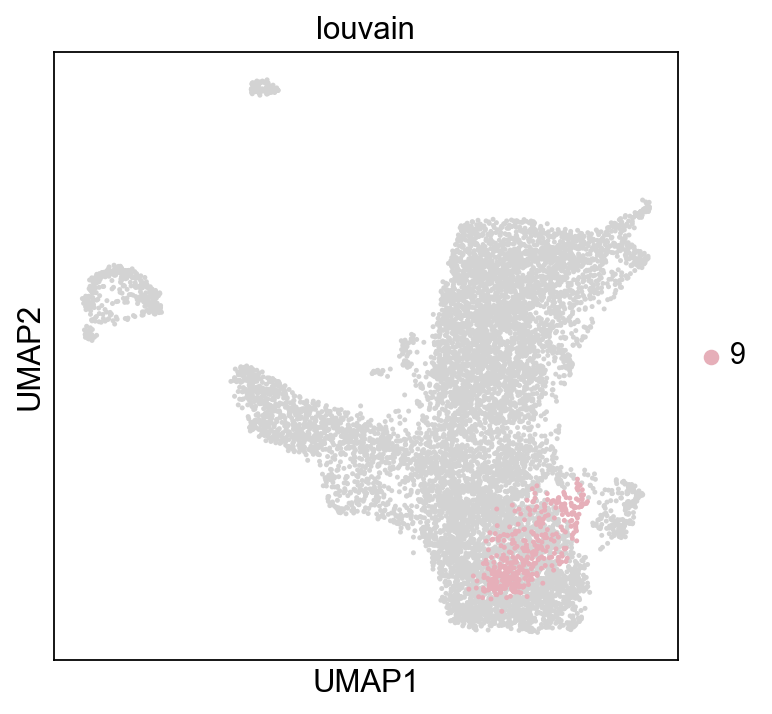

In [13]:
rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata_cor, color='louvain', size=20)
sc.pl.umap(adata_cor, color='louvain', groups=['9'], size=20)

Comment: Clusters 13, 22, 23 and 24 should be split, because these cells belong together due to low counts rather than similar expression. We also split cluster 9 in the epiblast regime.

In [14]:
sc.tl.louvain(adata_cor, restrict_to=['louvain', ['13']], resolution=0.2, key_added='louvain_R')
sc.tl.louvain(adata_cor, restrict_to=['louvain_R', ['22']], resolution=0.2, key_added='louvain_R')
sc.tl.louvain(adata_cor, restrict_to=['louvain_R', ['23']], resolution=0.2, key_added='louvain_R')
sc.tl.louvain(adata_cor, restrict_to=['louvain_R', ['24']], resolution=0.2, key_added='louvain_R')
sc.tl.louvain(adata_cor, restrict_to=['louvain_R', ['9']], resolution=0.2, key_added='louvain_R')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 29 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 30 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 31 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 32 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 33 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)


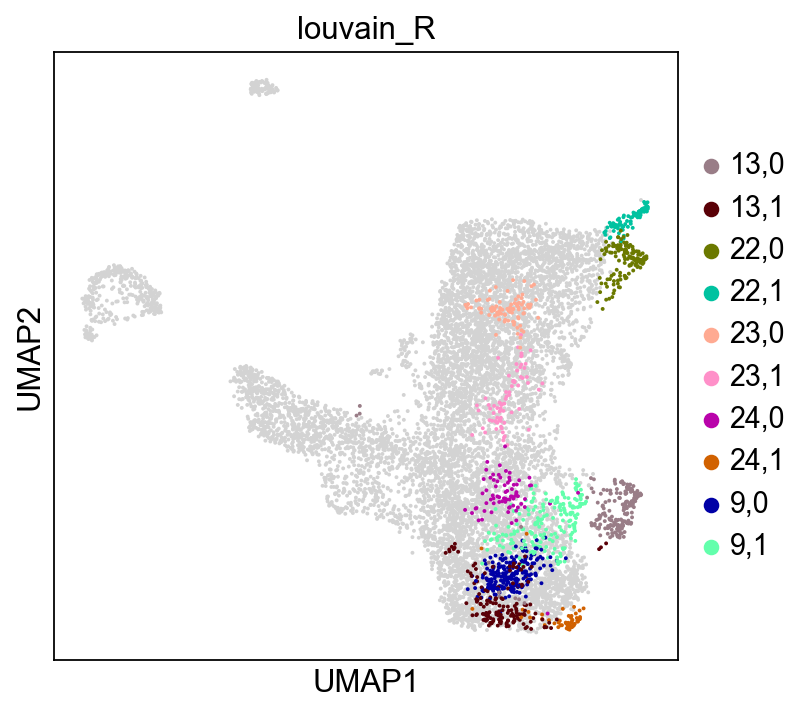

In [15]:
sc.pl.umap(adata_cor, color='louvain_R', groups=['13,0', '13,1', '22,0','22,1', 
                                                 '23,0','23,1', '24,0', '24,1', '9,0','9,1'])

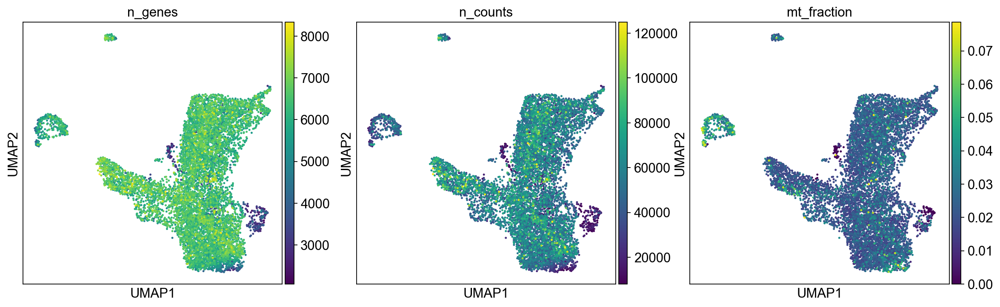

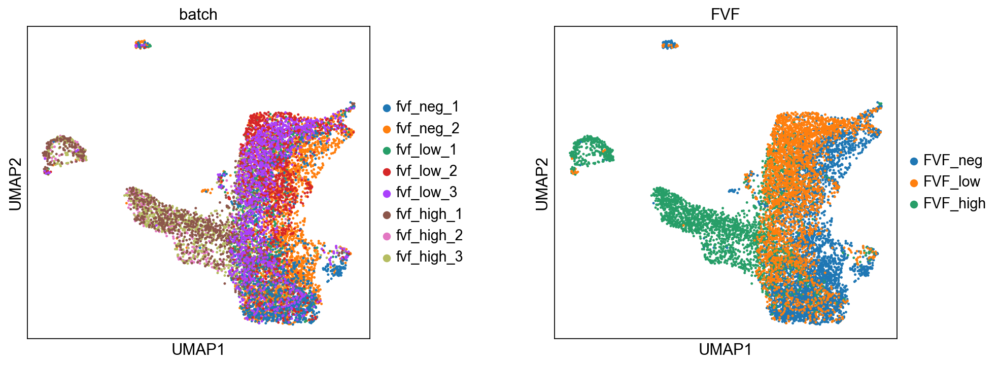

In [16]:
sc.pl.umap(adata_cor, color=['n_genes', 'n_counts', 'mt_fraction'], size=20)
sc.pl.umap(adata_cor, color=['batch', 'FVF'], wspace=0.4,size=20)

## Characterise clusters

In [17]:
sc.tl.rank_genes_groups(adata_cor, groupby='louvain_R')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:16)


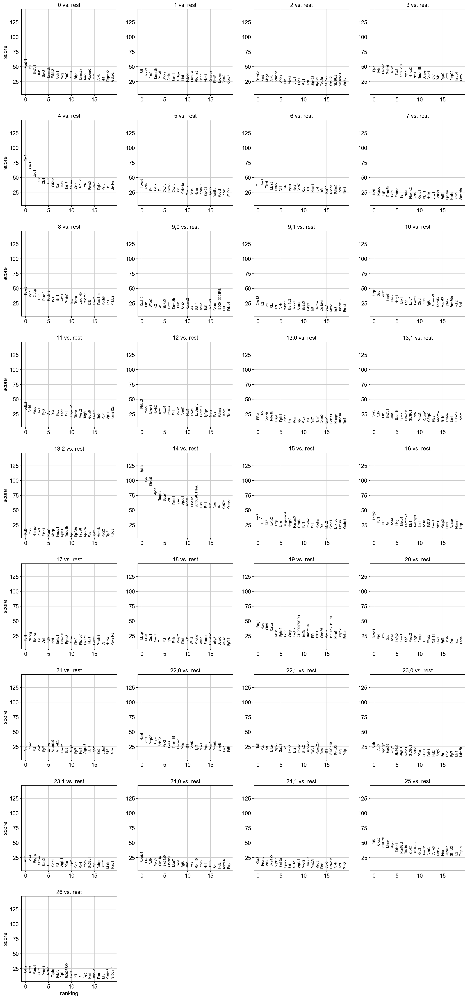

In [18]:
sc.pl.rank_genes_groups(adata_cor)

# Annotation

For annotation, we analyse the differential expression results and above and orientate on known tissue marker genes:

- Ectoderm (epiblast): Utf1 (Sox2, Pou3f1)
- anterior epiblast: Pou3f1, Otx2, Sox2
- posterior epiblast: Lefty2, Eomes, Tdgf1, Wnt3

- Mesoderm in general: Twist1 (Wnt2, Rasgrp3)
- Cardiac Mesoderm: Hand1 (Hand2, Myl7)
- Pre Somitic mesoderm: Fgf4 (Hes7, Cdx1)
- Axial mesendoderm (notochord): Pifo (Foxj1), Noto
- paraxial mesoderm:  Tbx1, Meox1, Tcf15
- intermediate mesoderm: Osr1, Pax2/8, Lhx1
- Mesoderm progenitors: Nkx1-2

- primordial germ cells (PGC): Ifitm3, Dppa3

- Endoderm: Sox17 (Lefty1, Hhex)


- Extraembryonic ectoderm: Gm9 (Rhox1, Elf5)
- Extraembryonic endoderm = visceral endoderm: Afp (Apoa4, S100g)

- primitive streak: Eomes, Nanog, (Pou5f1)
- anterior primitive streak: Gsc, Mixl1, (Hhex), Otx2


In [19]:
markers_ecto=['Utf1', #ectoderm
              'Otx2','Sox2','Pou3f1', # anterior epiblast
              'Lefty2', 'Tdgf1','Wnt3' # posterior epiblast
        ]

markers_meso=['Twist1','Wnt2','Rasgrp3', #mesoderm (general)
         'Hand1','Hand2','Myl7', #cardiac mesoderm
         'Fgf4','Hes7','Cdx1', #pre-somitic mesoderm
         'Pifo','Foxj1', #axial mesendoderm
         'Tbx1', 'Meox1', 'Tcf15',#paraxial mesoderm
         'Osr1', 'Pax2', 'Pax8', 'Lhx1', #intermediate mesoderm
         'Nkx1-2', #mesoderm progenitors
         'Dppa3', 'Ifitm3', #primordial germ cells
         'Hhex','Kdr', "Etv2",'Tal1', #haematoendothelial progenitors
              'Ecscr', 'Mest', #endothel marker
              'Aldh1a2' #somitic mesoderm
        ]

markers_endo=[
         'Sox17','Lefty1','Hhex','Krt18', #endoderm 
        
        ]

markers_extra=['Gm9','Rhox1','Elf5', #extraembryonic ectoderm
         'Afp','Apoa4','S100g' #extraembryonic endoderm
              ]

markers_ps =['Eomes', 'Nanog', 'Pou5f1','Fgf8', #primitive streak
            'Otx2', 'Gsc', 'Mixl1', 'Hhex', 'Pax7','Cer1' #anterior primitive streak 
            ]

markers=np.concatenate([ markers_ps,markers_ecto, markers_meso, markers_endo, markers_extra])


Plot all marker genes in a UMAP.

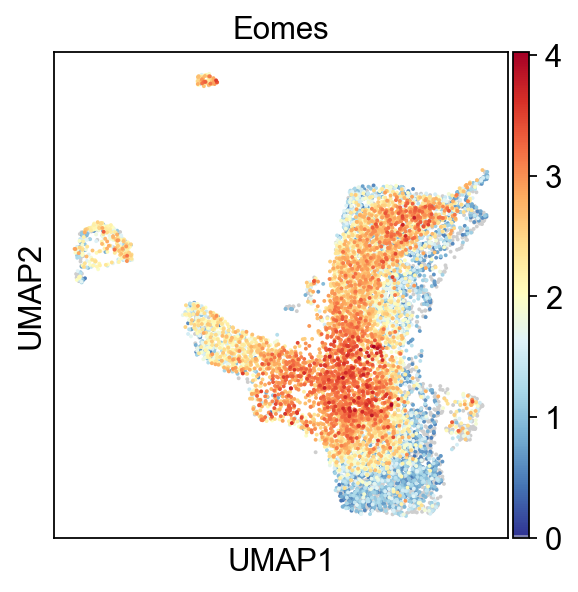

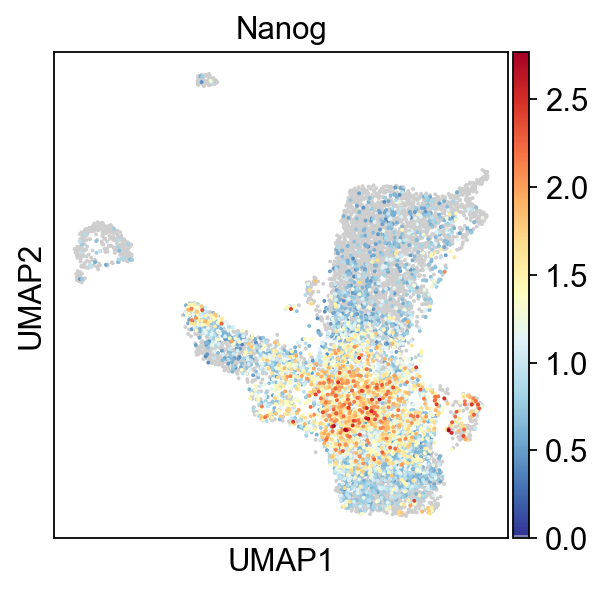

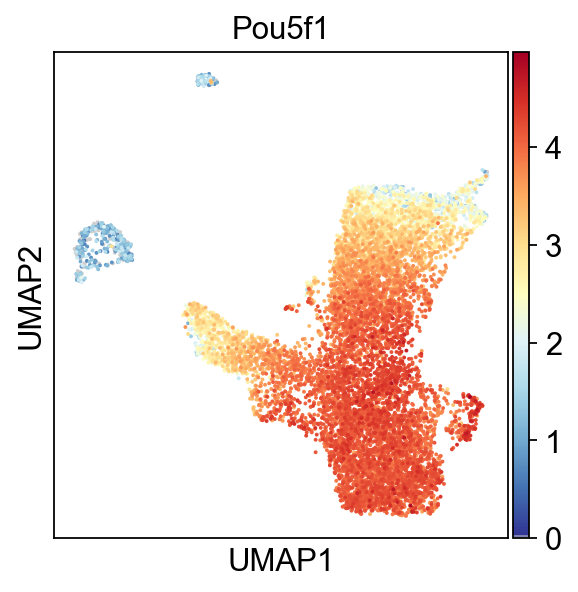

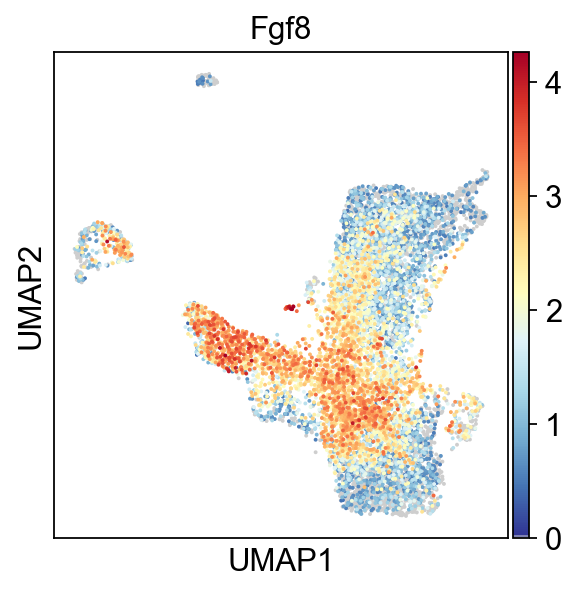

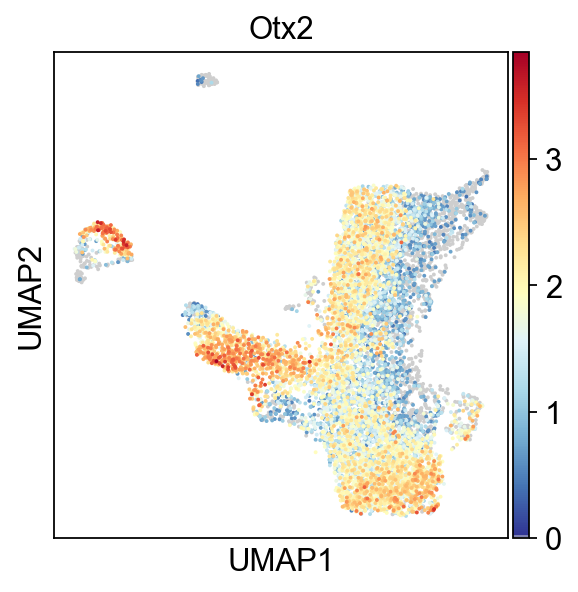

...

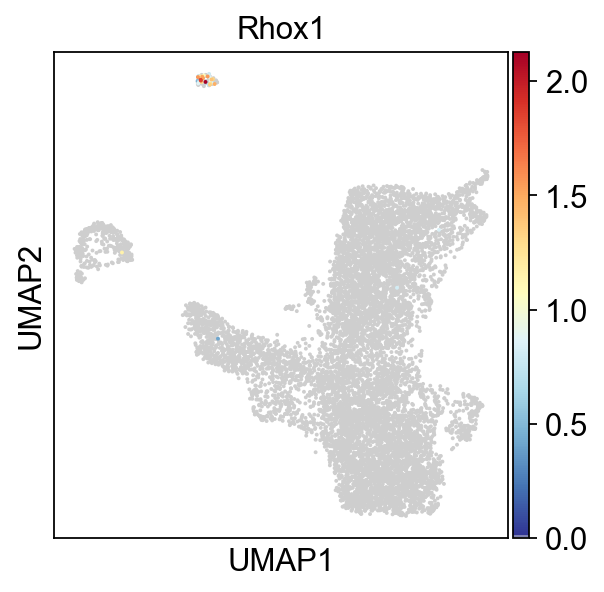

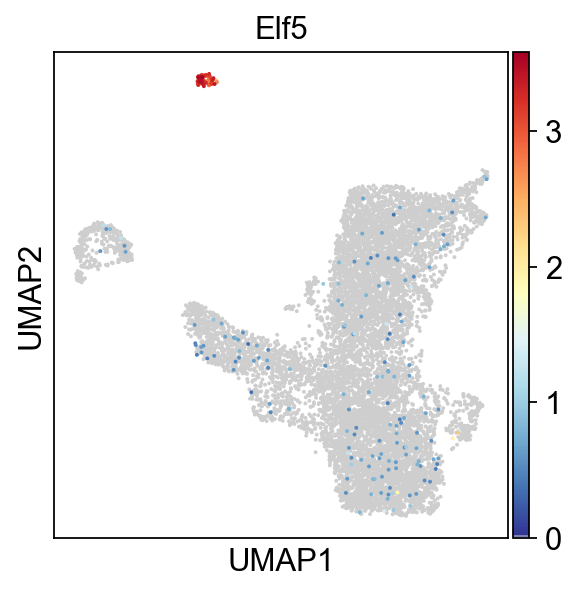

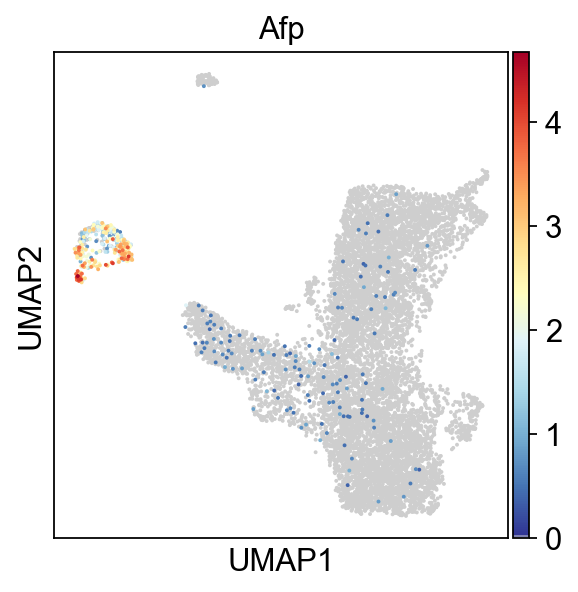

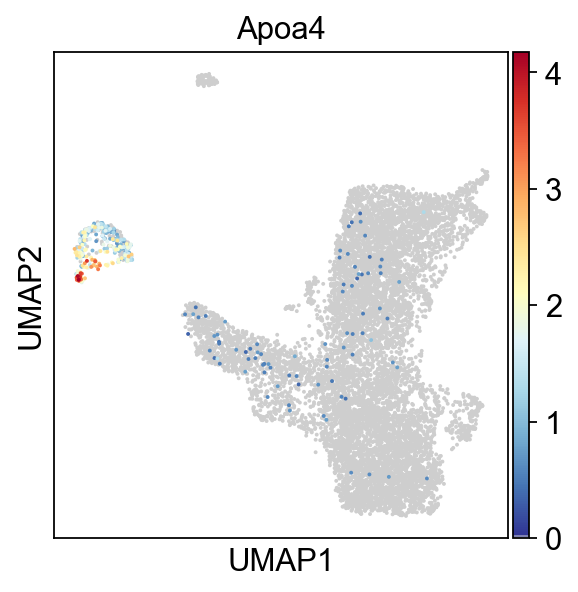

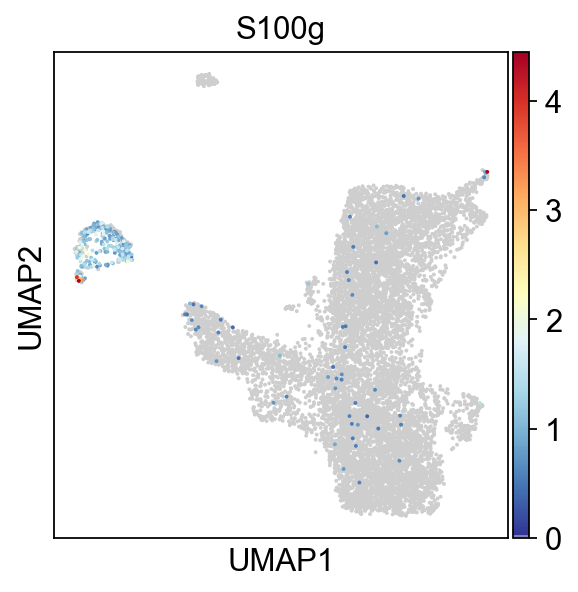

In [20]:
rcParams['figure.figsize'] = (4,4)
for gene_name in markers_ps:
    sc.pl.umap(adata_cor, color = gene_name, cmap=mymap)
    
for gene_name in markers_ecto:
    sc.pl.umap(adata_cor, color = gene_name, cmap=mymap)

for gene_name in markers_meso:
    sc.pl.umap(adata_cor, color = gene_name, cmap=mymap)
    
for gene_name in markers_endo:
    sc.pl.umap(adata_cor, color = gene_name, cmap=mymap)
    
for gene_name in markers_extra:
    sc.pl.umap(adata_cor, color = gene_name, cmap=mymap)

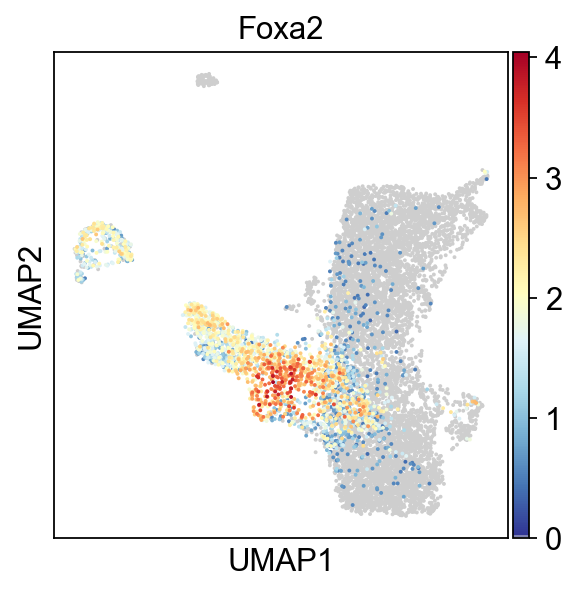

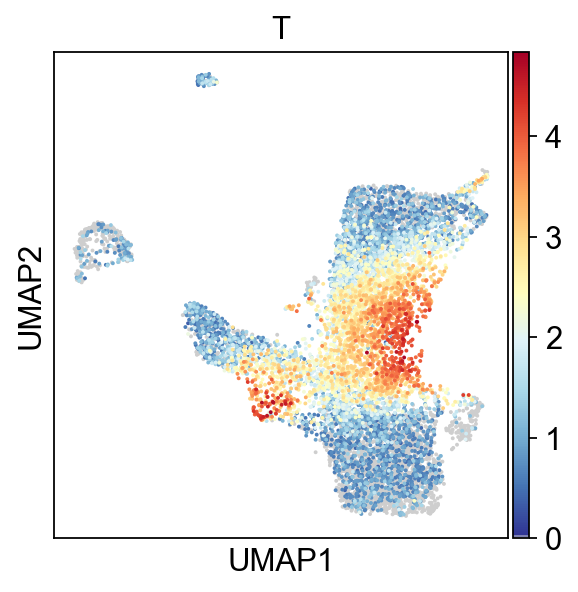

In [21]:
genes_oi = ['Foxa2','T']
for gene_name in genes_oi:
    sc.pl.umap(adata_cor, color = gene_name, cmap=mymap)

Compute score for each tissue type and visualise in a UMAP. Scores below 0 are cut off in the plot.

In [22]:
sc.tl.score_genes(adata_cor, gene_list=markers_ecto, score_name='epiblast')
sc.tl.score_genes(adata_cor, gene_list=markers_endo, score_name='endoderm')
sc.tl.score_genes(adata_cor, gene_list=markers_ps, score_name='primitive_streak')
sc.tl.score_genes(adata_cor, gene_list=['Gm9','Rhox1','Elf5'], score_name='extraembryonic_ecto')
sc.tl.score_genes(adata_cor, gene_list=['Afp','Apoa4','S100g'], score_name='extraembryonic_endo')
sc.tl.score_genes(adata_cor, gene_list=markers_meso, score_name='mesoderm')

computing score 'epiblast'
    finished: added
    'epiblast', score of gene set (adata.obs) (0:00:00)
computing score 'endoderm'
    finished: added
    'endoderm', score of gene set (adata.obs) (0:00:00)
computing score 'primitive_streak'
    finished: added
    'primitive_streak', score of gene set (adata.obs) (0:00:00)
computing score 'extraembryonic_ecto'
    finished: added
    'extraembryonic_ecto', score of gene set (adata.obs) (0:00:00)
computing score 'extraembryonic_endo'
    finished: added
    'extraembryonic_endo', score of gene set (adata.obs) (0:00:00)
computing score 'mesoderm'
    finished: added
    'mesoderm', score of gene set (adata.obs) (0:00:00)


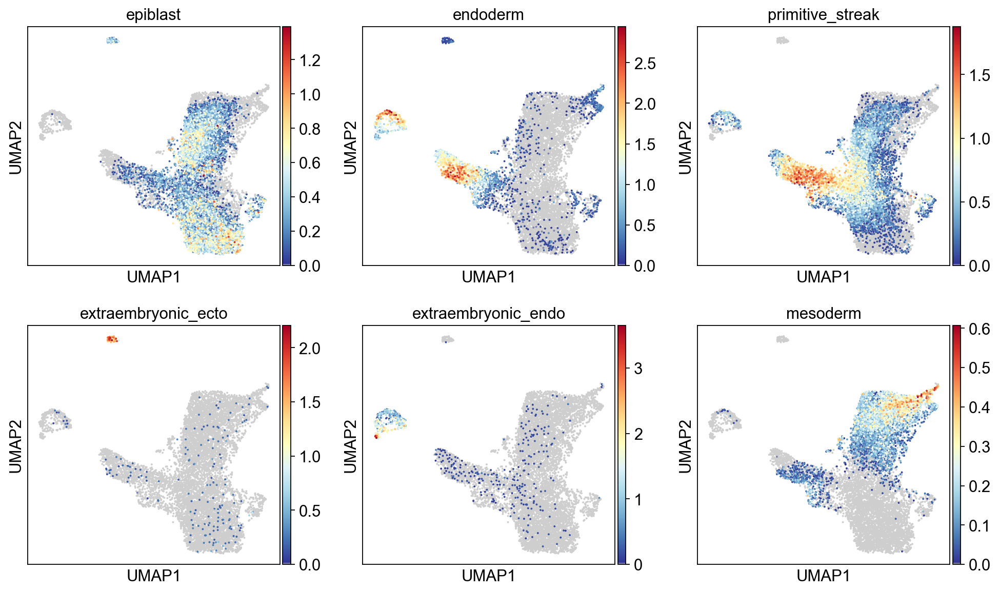

In [23]:
sc.pl.umap(adata_cor, color=['epiblast', 'endoderm', 'primitive_streak', 
                             'extraembryonic_ecto', 'extraembryonic_endo', 'mesoderm'], ncols=3, cmap=mymap, vmin=0)

Compute mean expression of the marker genes per cluster (on `raw` object, if present, *i.e.* the logCPM normalised values).

In [24]:
df = pd.DataFrame(data = adata_cor.raw.X[:,np.in1d(adata_cor.raw.var_names,markers)].todense(), 
                  index = adata_cor.obs_names, 
                  columns=adata_cor.raw.var_names[np.in1d(adata_cor.raw.var_names, markers)].values)


In [25]:
df['louvain']= pd.Series(adata_cor.obs['louvain_R'], index=df.index)

In [26]:
df_all = pd.DataFrame(df.groupby(by='louvain')['Utf1'].apply(np.mean).values,
                      index=df.groupby(by='louvain')['Utf1'].apply(np.mean).index,
                      columns=['mean_Utf1'])

In [27]:
df_all['mean_Sox2']=df.groupby(by='louvain')['Sox2'].apply(np.mean).values
df_all['mean_Pou3f1']=df.groupby(by='louvain')['Pou3f1'].apply(np.mean).values

df_all['mean_Twist1']=df.groupby(by='louvain')['Twist1'].apply(np.mean).values
df_all['mean_Wnt2']=df.groupby(by='louvain')['Wnt2'].apply(np.mean).values
df_all['mean_Rasgrp3']=df.groupby(by='louvain')['Rasgrp3'].apply(np.mean).values

df_all['mean_Hand1']=df.groupby(by='louvain')['Hand1'].apply(np.mean).values
df_all['mean_Hand2']=df.groupby(by='louvain')['Hand2'].apply(np.mean).values
df_all['mean_Myl7']=df.groupby(by='louvain')['Myl7'].apply(np.mean).values

df_all['mean_Tal1']=df.groupby(by='louvain')['Tal1'].apply(np.mean).values

df_all['mean_Tcf15']=df.groupby(by='louvain')['Tcf15'].apply(np.mean).values
df_all['mean_Aldh1a2']=df.groupby(by='louvain')['Aldh1a2'].apply(np.mean).values

df_all['mean_Osr1']=df.groupby(by='louvain')['Osr1'].apply(np.mean).values
df_all['mean_Mixl1']=df.groupby(by='louvain')['Mixl1'].apply(np.mean).values

df_all['mean_Fgf4']=df.groupby(by='louvain')['Fgf4'].apply(np.mean).values
df_all['mean_Hes7']=df.groupby(by='louvain')['Hes7'].apply(np.mean).values
df_all['mean_Cdx1']=df.groupby(by='louvain')['Cdx1'].apply(np.mean).values

df_all['mean_Pifo']=df.groupby(by='louvain')['Pifo'].apply(np.mean).values
df_all['mean_Foxj1']=df.groupby(by='louvain')['Foxj1'].apply(np.mean).values

df_all['mean_Sox17']=df.groupby(by='louvain')['Sox17'].apply(np.mean).values
df_all['mean_Lefty1']=df.groupby(by='louvain')['Lefty1'].apply(np.mean).values
df_all['mean_Hhex']=df.groupby(by='louvain')['Hhex'].apply(np.mean).values

df_all['mean_Pax7']=df.groupby(by='louvain')['Pax7'].apply(np.mean).values
df_all['mean_Eomes']=df.groupby(by='louvain')['Eomes'].apply(np.mean).values
df_all['mean_Nanog']=df.groupby(by='louvain')['Nanog'].apply(np.mean).values
df_all['mean_Fgf8']=df.groupby(by='louvain')['Fgf8'].apply(np.mean).values

df_all['mean_Dppa3']=df.groupby(by='louvain')['Dppa3'].apply(np.mean).values

df_all['mean_Gm9']=df.groupby(by='louvain')['Gm9'].apply(np.mean).values
df_all['mean_Rhox1']=df.groupby(by='louvain')['Rhox1'].apply(np.mean).values
df_all['mean_Elf5']=df.groupby(by='louvain')['Elf5'].apply(np.mean).values

df_all['mean_Afp']=df.groupby(by='louvain')['Afp'].apply(np.mean).values
df_all['mean_Apoa4']=df.groupby(by='louvain')['Apoa4'].apply(np.mean).values
df_all['mean_S100g']=df.groupby(by='louvain')['S100g'].apply(np.mean).values

df_all['mean_Nkx1-2']=df.groupby(by='louvain')['Nkx1-2'].apply(np.mean).values

In [28]:
df_all[['mean_Nkx1-2', 'mean_Fgf4', 'mean_Hes7', 'mean_Utf1', 'mean_Myl7', 'mean_Hand1', 'mean_Tcf15']].head()

,mean_Nkx1-2,mean_Fgf4,mean_Hes7,mean_Utf1,mean_Myl7,mean_Hand1,mean_Tcf15
louvain,,,,,,,
0,0.086665,0.110293,0.047546,3.433210,0.595522,0.079878,0.274992
1,0.242884,0.076001,0.058425,3.360926,0.573970,0.078958,0.268678
2,0.445479,0.059269,0.072865,2.589730,0.605268,0.109054,0.195066
3,0.013334,0.044112,0.025910,0.248038,3.099727,2.203762,0.245383
4,0.017065,0.011300,0.023315,0.209396,0.400327,0.017987,0.174476


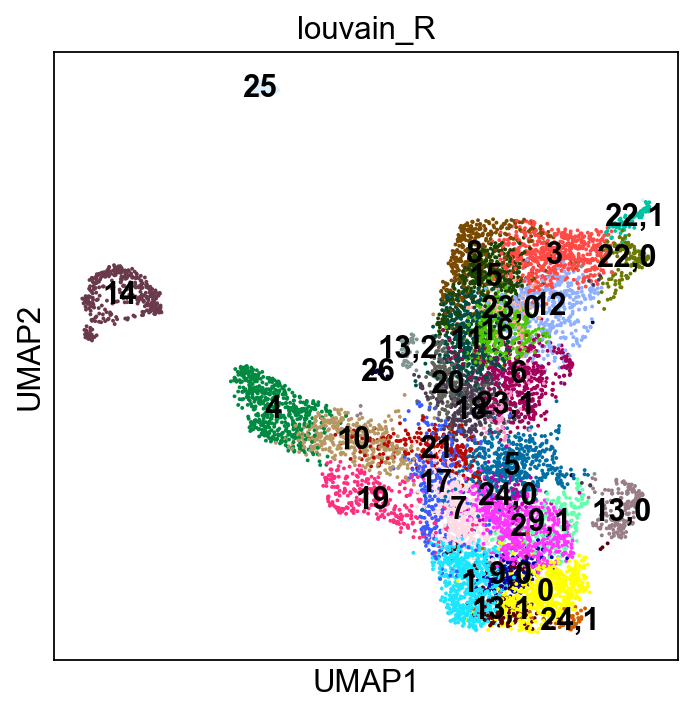

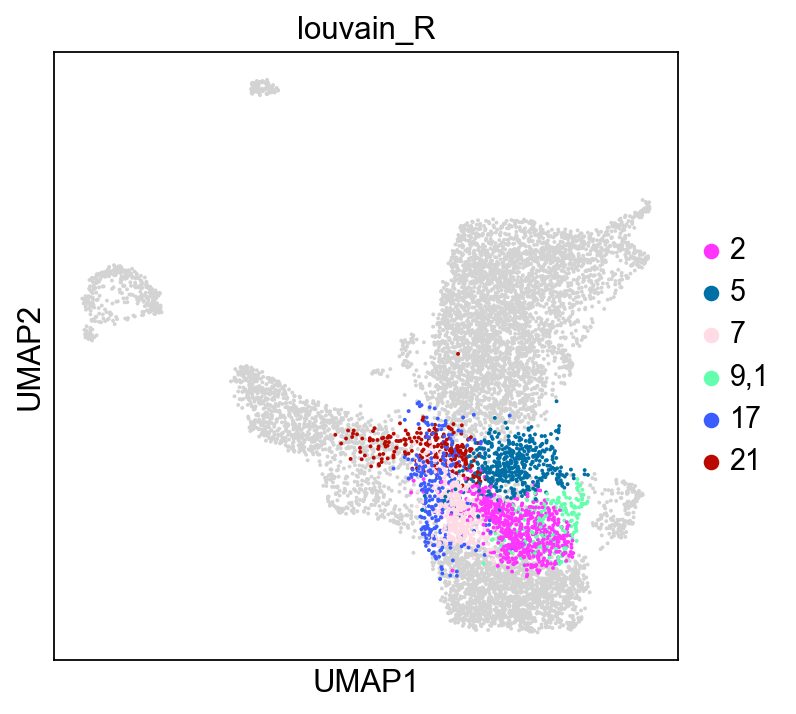

In [29]:
rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata_cor, color='louvain_R', legend_loc='on data')
sc.pl.umap(adata_cor, color='louvain_R', groups=['2', '5','7','9,1', '17','21'])


Compute the dendrogram for the data.

In [30]:
sc.tl.dendrogram(adata_cor,groupby='louvain_R')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain_R']`


Visualise marker gene expression for each cluster.

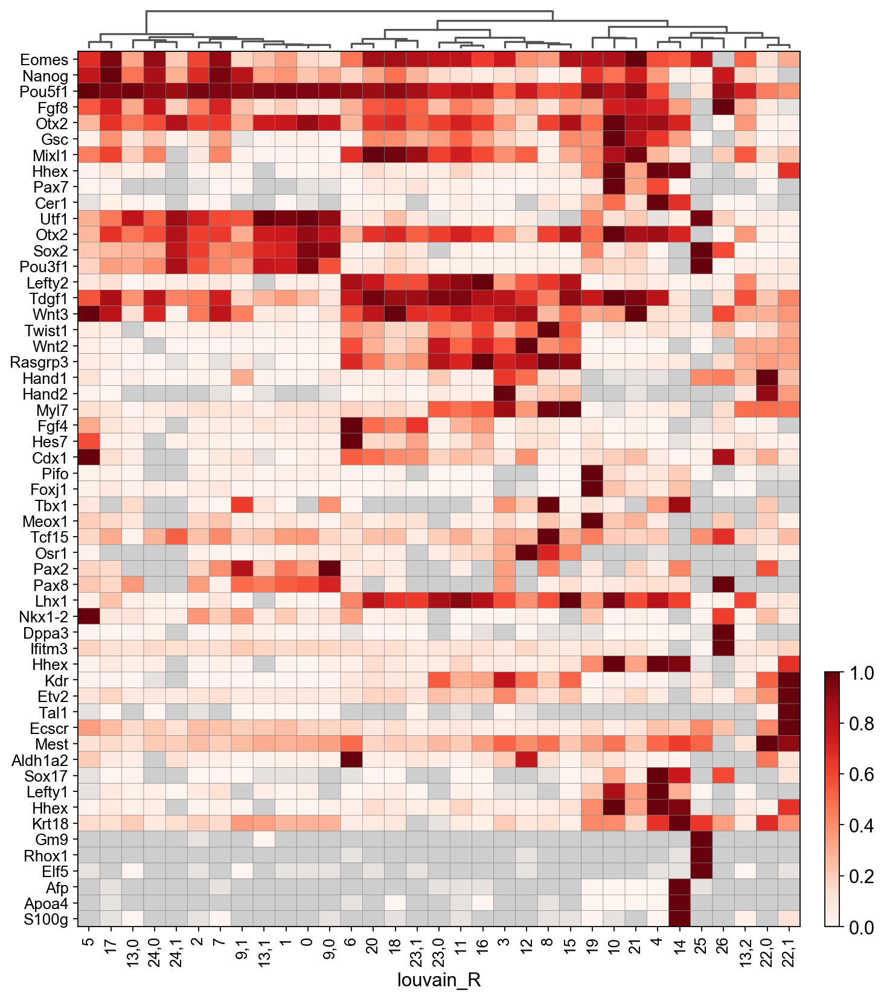

GridSpec(2, 3, height_ratios=[0.5, 11.0], width_ratios=[9.9, 0, 0.2])

In [31]:
sc.pl.matrixplot(adata_cor, use_raw=True, standard_scale='var',
                 var_names=markers, groupby='louvain_R', cmap=mymap2, swap_axes=True, dendrogram=True)


## Create a first annotation

The extraembryonic tissues are easiest to identify as they form small distinct clusters with a clear and specific marker gene expression. We use the mean gene expression per cluster to annotate.

In [32]:
adata_cor.obs['tissues'] = adata_cor.obs['louvain_R'].cat.add_categories(['extraembryonic endoderm', 
                                                                        'extraembryonic ectoderm', 
                                                                          'endoderm progenitors',
                                                                        'endoderm', 
                                                                        'anterior primitive streak',
                                                                        'primitive streak',
                                                                        'PGC',
                                                                        'cardiac mesoderm',
                                                                        'paraxial mesoderm',
                                                                        'somitic mesoderm',
                                                                        'intermediate mesoderm',
                                                                        'pre-somitic mesoderm',
                                                                        'nascent endothelium',
                                                                        'axial mesendoderm',
                                                                        #'notochord',
                                                                        'mesoderm progenitors',
                                                                        'epiblast'])

adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'], 
                                 df_all[df_all['mean_Elf5']>0.5].index)] = 'extraembryonic ectoderm'
adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'], 
                                 df_all[df_all['mean_Afp']>0.5].index)] = 'extraembryonic endoderm'

adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'], 
                                 df_all[df_all['mean_Pax7']>0.4].index)] ='anterior primitive streak'
#adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'],['24'])] ='anterior primitive streak'
adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'],['2', '5','7','9,1', '17','21', '24,0'])] ='primitive streak'
#adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'],['29'])] ='blood related'
adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'], 
                                 df_all[df_all['mean_Dppa3']>1].index)] ='PGC'

adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'], 
                                 df_all[np.logical_and(df_all['mean_Pifo']>1,
                                                       df_all['mean_Foxj1']>2)].index)] ='axial mesendoderm'

adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'], 
                                 df_all[df_all['mean_Tcf15']>0.5].index)] ='paraxial mesoderm'

adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'], 
                                 df_all[df_all['mean_Osr1']>0.1].index)] ='intermediate mesoderm'

adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'], 
                                 df_all[df_all['mean_Aldh1a2']>0.35].index)] ='somitic mesoderm'

adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'], 
                                 df_all[np.logical_and(np.logical_or(df_all['mean_Fgf4']>0.35,
                                                                      df_all['mean_Hes7']>0.4),
                                                        df_all['mean_Nkx1-2']<=0.6)
                                                       ].index)] ='pre-somitic mesoderm'

adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'], 
                                 df_all[np.logical_or(df_all['mean_Hand1']>1.2, 
                                                       df_all['mean_Myl7']>1.5)].index)] ='cardiac mesoderm'

adata_cor.obs['tissues'][np.in1d(adata_cor.obs['louvain_R'], 
                                 df_all[df_all['mean_Tal1']>1].index)] ='nascent endothelium'

adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'], 
                                 df_all[np.logical_and(df_all['mean_Sox17']>2.8, 
                                                       df_all['mean_Hhex']>0.5)].index)] ='endoderm'
#adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'], 
#                                 df_all[np.logical_or(df_all['mean_Twist1']>0.5,
#df_all['mean_Rasgrp3']>0.5 )].index)] ='mesoderm'

adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'], 
                                 df_all[df_all['mean_Nkx1-2']>1].index)] ='mesoderm progenitors'
#adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'],['32'])] ='mesoderm progenitors'
adata_cor.obs['tissues'][np.in1d(adata_cor.obs['tissues'], 
                                 df_all[np.logical_and(df_all['mean_Utf1']>1.45, 
                                                       df_all['mean_Pou3f1']>0.5)].index)] ='epiblast'

adata_cor.obs['tissues'] = adata_cor.obs['tissues'].cat.remove_unused_categories()

In [33]:
pd.value_counts(adata_cor.obs['tissues'])

primitive streak             2311
epiblast                     1929
pre-somitic mesoderm         1773
cardiac mesoderm             1183
endoderm                      553
paraxial mesoderm             425
anterior primitive streak     402
intermediate mesoderm         389
extraembryonic endoderm       352
axial mesendoderm             278
nascent endothelium            91
extraembryonic ectoderm        87
PGC                            21
Name: tissues, dtype: int64

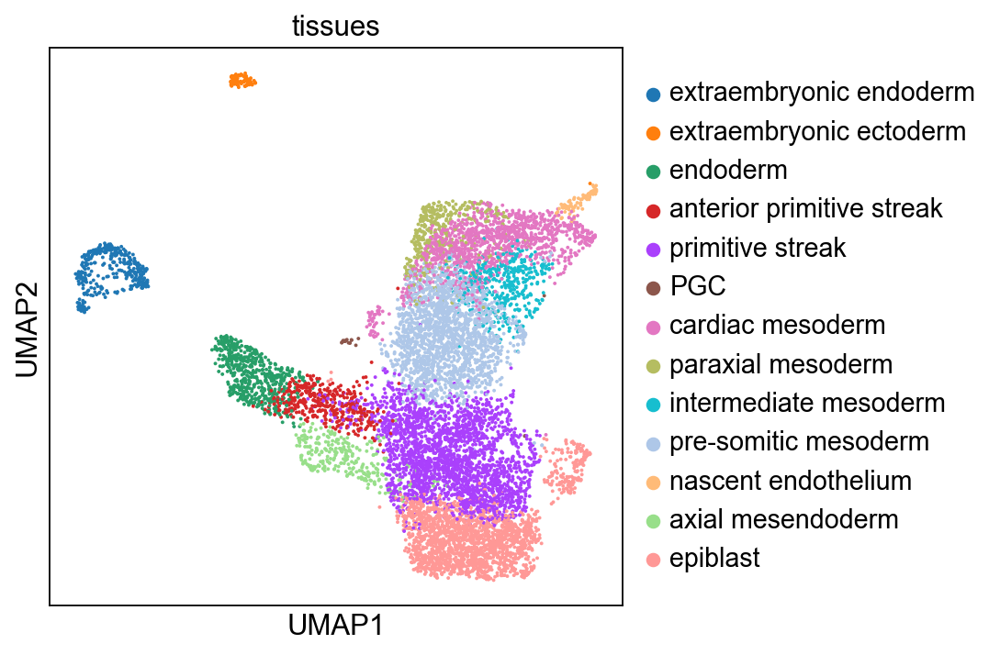

In [34]:
sc.pl.umap(adata_cor, color='tissues')

## Refine mesoderm 

Next, we merge and rename the mesoderm subclusters into 4 categories:

* paraxial mesoderm - somitic, pre-somitic mesoderm
* intermediate mesoderm
* lateral plate mesoderm - cardiac mesoderm
* nascent endothelium

In [35]:
adata_cor.obs['tissues_merge'] = adata_cor.obs['tissues'].cat.add_categories(['lateral plate mesoderm'])

adata_cor.obs['tissues_merge'][np.in1d(adata_cor.obs['tissues'], 
                                       ['somitic mesoderm', 'pre-somitic mesoderm'])] = 'paraxial mesoderm'

adata_cor.obs['tissues_merge'][np.in1d(adata_cor.obs['tissues'], 
                                       ['cardiac mesoderm'])] = 'lateral plate mesoderm'

adata_cor.obs['tissues_merge'] = adata_cor.obs['tissues_merge'].cat.remove_unused_categories()

In [36]:
adata_cor.obs['tissues_merge'].value_counts()

primitive streak             2311
paraxial mesoderm            2198
epiblast                     1929
lateral plate mesoderm       1183
endoderm                      553
anterior primitive streak     402
intermediate mesoderm         389
extraembryonic endoderm       352
axial mesendoderm             278
nascent endothelium            91
extraembryonic ectoderm        87
PGC                            21
Name: tissues_merge, dtype: int64

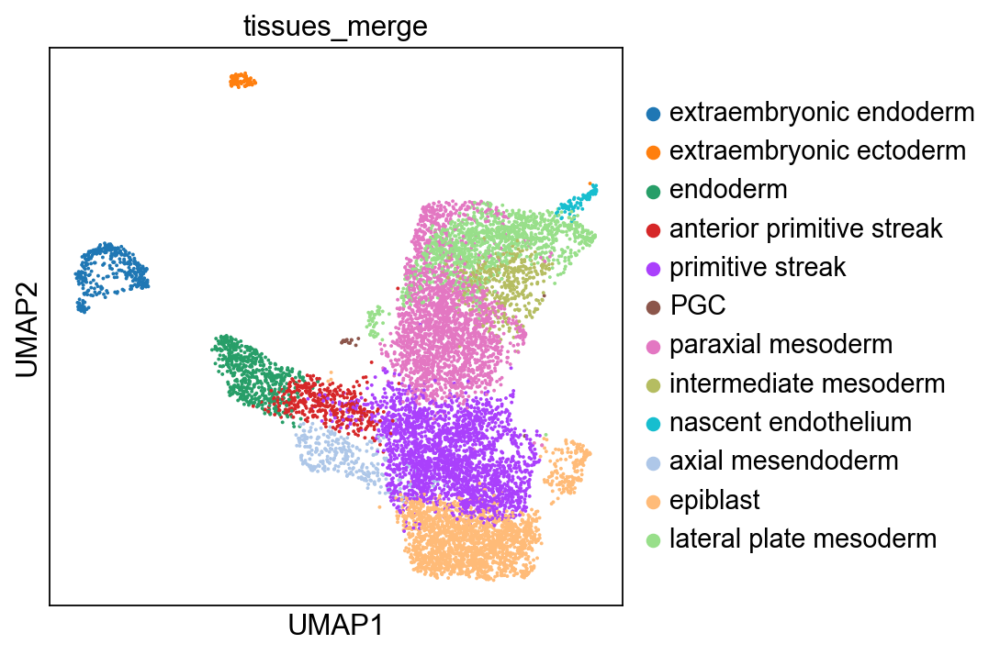

In [37]:
rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata_cor, color='tissues_merge')

### Resolve endoderm branch

In the next step, we review the cell type identity on the endoderm branch. For this purpose, we resolve anterior primitive streak and endoderm to distinguish anterior primitive streak, endoderm progenitors and endoderm.

In [38]:
sc.tl.louvain(adata_cor, resolution=0.5,  restrict_to=['tissues_merge', 
                             ['anterior primitive streak', 'endoderm']], key_added='endoderm_res')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 14 clusters and added
    'endoderm_res', the cluster labels (adata.obs, categorical) (0:00:00)


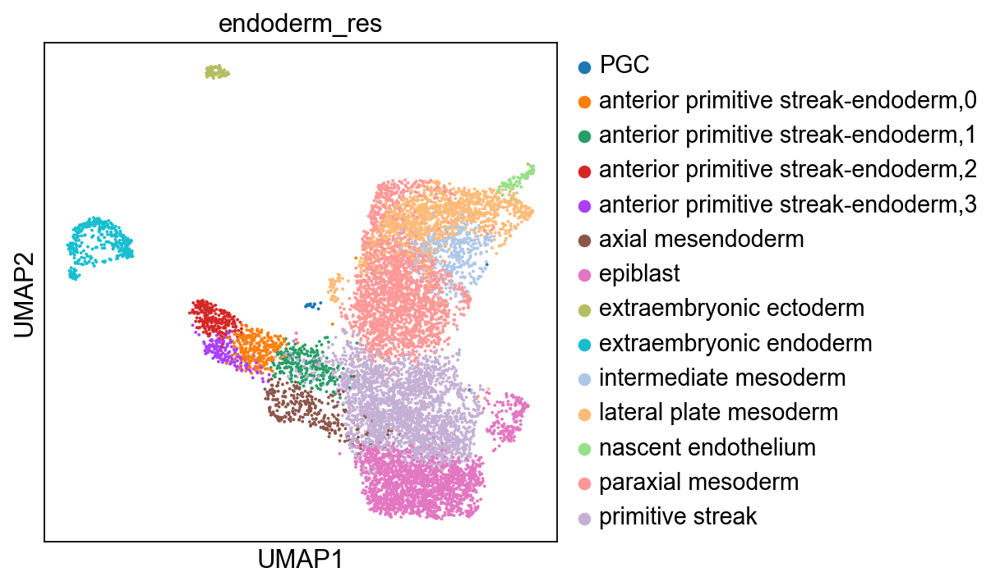

In [39]:
sc.pl.umap(adata_cor, color='endoderm_res')

Visualise endoderm marker gene expression for each cluster.

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_endoderm_res']`


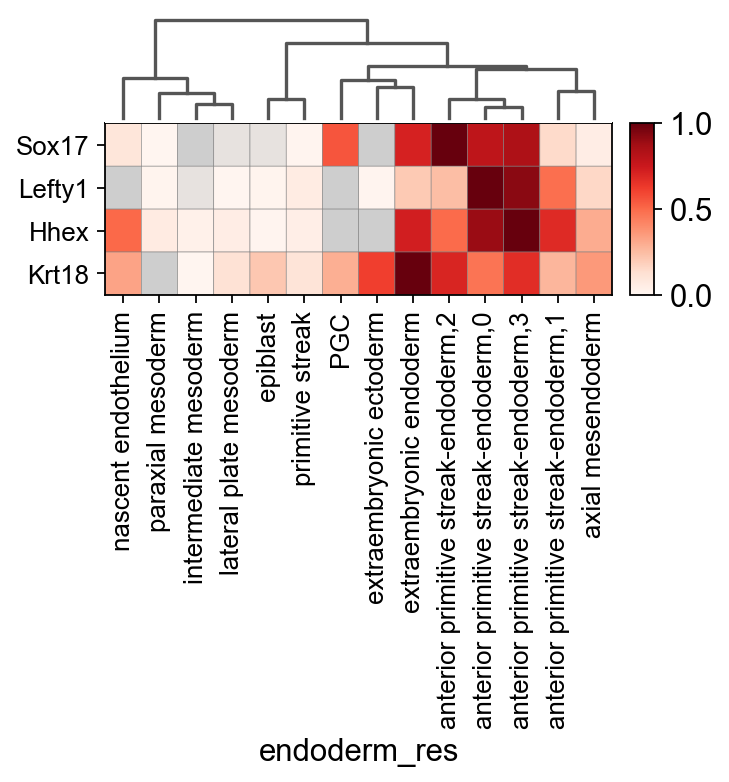

GridSpec(2, 3, height_ratios=[0.5, 0.8], width_ratios=[4.2, 0, 0.2])

In [40]:
sc.pl.matrixplot(adata_cor, use_raw=True, standard_scale='var',
                 var_names=markers_endo, groupby='endoderm_res', cmap=mymap2, swap_axes=True, dendrogram=True)

All clusters previously annotated as anterior primitive streak and endoderm show a clear endoderm gene expression signature. 
Merge the clusters 0, 2 and 3 as anterior definitive endoderm and rename cluster 1 to transitory progenitors.

In [41]:
adata_cor.obs['tissues_merge'] = adata_cor.obs['tissues_merge'].cat.add_categories(['transitory progenitors', 
                                                                                    'anterior definitive endoderm'
                                                                                   ])
adata_cor.obs['tissues_merge'][np.in1d(adata_cor.obs['endoderm_res'], 
                                       ['anterior primitive streak-endoderm,0',
                                        'anterior primitive streak-endoderm,2',
                                        'anterior primitive streak-endoderm,3'])] = 'anterior definitive endoderm'
adata_cor.obs['tissues_merge'][np.in1d(adata_cor.obs['endoderm_res'], 
                                       ['anterior primitive streak-endoderm,1'])] = 'transitory progenitors'

adata_cor.obs['tissues_merge'] = adata_cor.obs['tissues_merge'].cat.remove_unused_categories()

### Resolve primitive streak region

Next, we aim to characterise the population currently named "primitive streak" and determine a clearer distinction with respect to endoderm and mesoderm cells. 

Let us first rename 'primitive streak' to 'decision region'.

In [42]:
adata_cor.obs['tissues_merge'].cat.categories

Index(['extraembryonic endoderm', 'extraembryonic ectoderm',
       'primitive streak', 'PGC', 'paraxial mesoderm', 'intermediate mesoderm',
       'nascent endothelium', 'axial mesendoderm', 'epiblast',
       'lateral plate mesoderm', 'transitory progenitors',
       'anterior definitive endoderm'],
      dtype='object')

In [43]:
adata_cor.obs['tissues_merge'] = adata_cor.obs['tissues_merge'].cat.rename_categories(
    {'primitive streak': 'decision region'})

Instead of defining a decision region, we will resolve subclusters of the decision region.

In [44]:
sc.tl.louvain(adata_cor, resolution=2,  restrict_to=['tissues_merge', 
                                                     ['decision region']], key_added='epiblast_res')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 30 clusters and added
    'epiblast_res', the cluster labels (adata.obs, categorical) (0:00:00)


Show marker genes.

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_epiblast_res']`


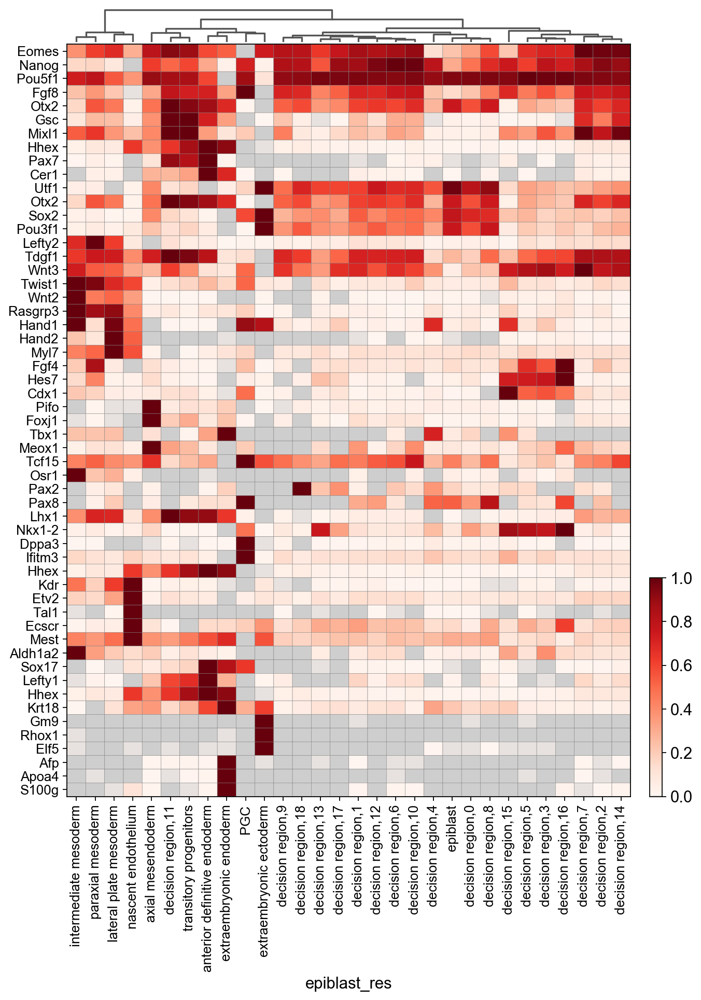

GridSpec(2, 3, height_ratios=[0.5, 11.0], width_ratios=[9.0, 0, 0.2])

In [45]:
sc.pl.matrixplot(adata_cor, use_raw=True, standard_scale='var',
                 var_names=markers, groupby='epiblast_res', cmap=mymap2, swap_axes=True, dendrogram=True)


While we observe some heterogeneity across the clusters and suspect a cell fate determination in the "decision region", we see a similarity to the epiblast gene expression in most clusters. Therefore, we term the different subtypes "posterior epiblast".

Let us check which groups cluster together.

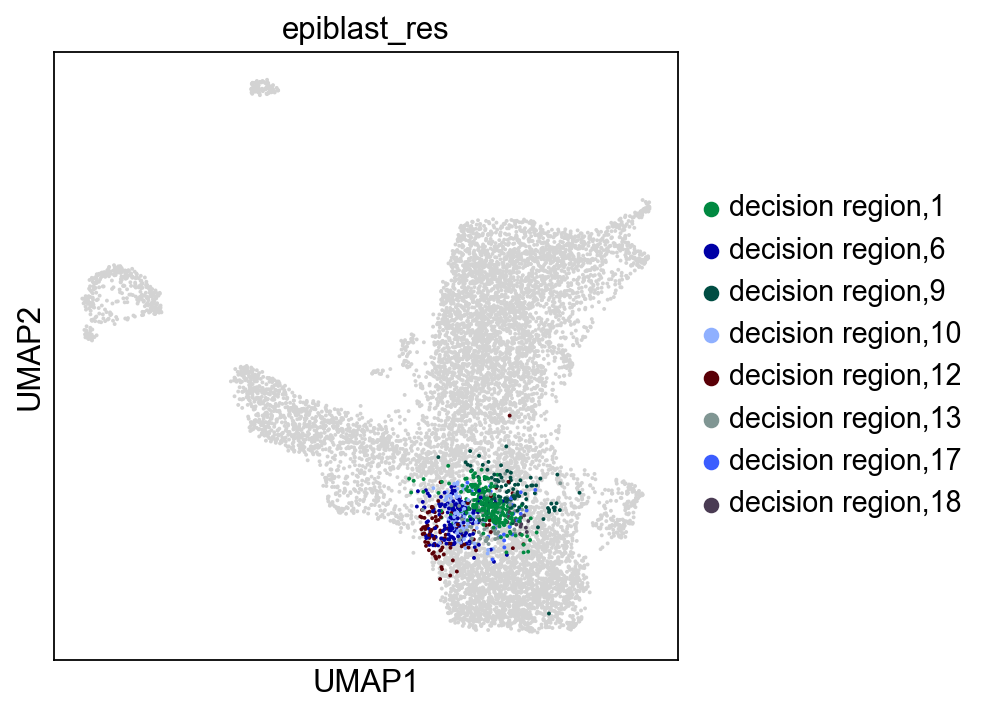

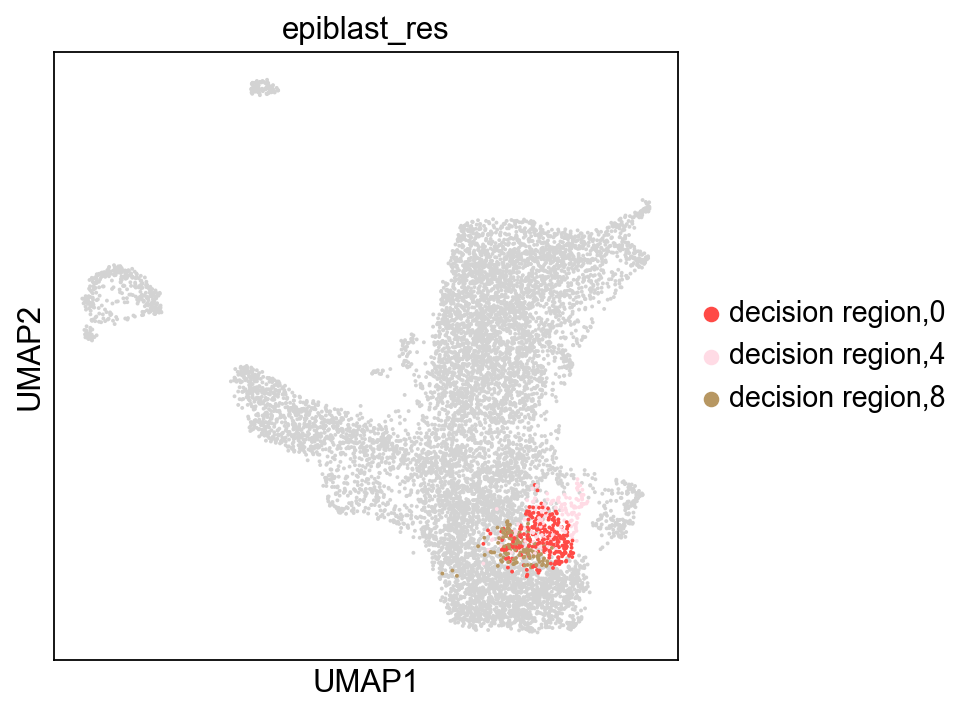

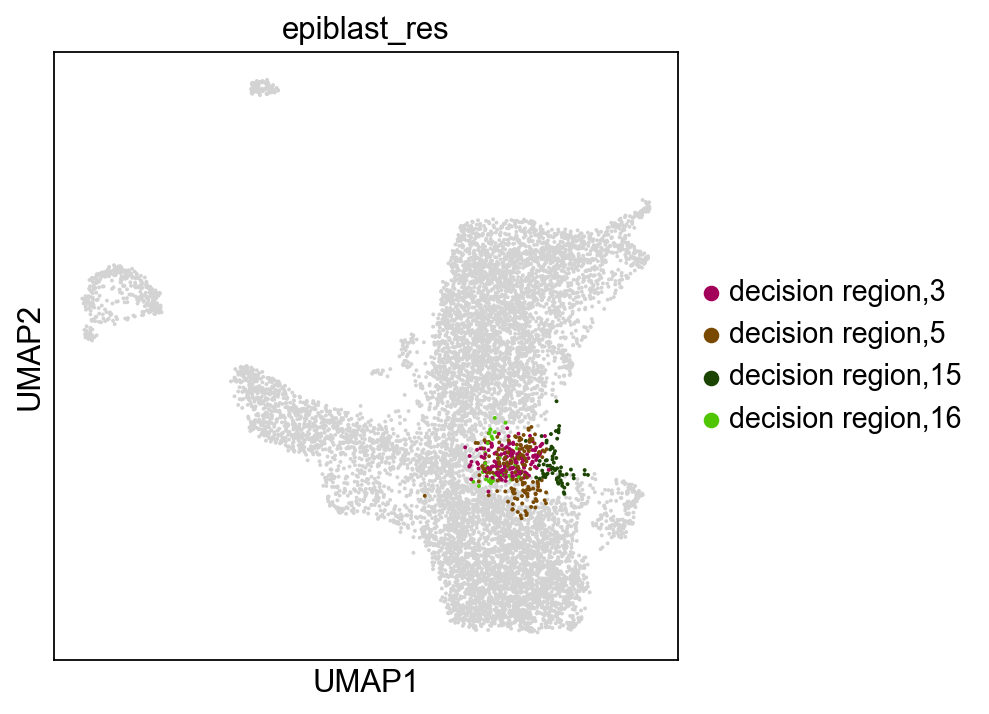

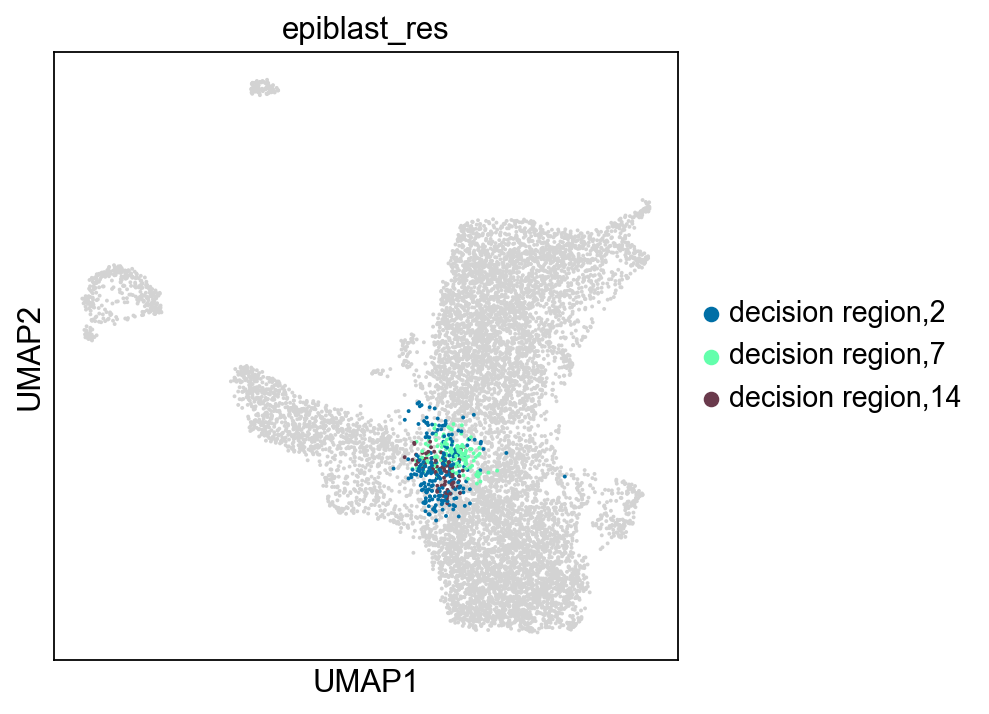

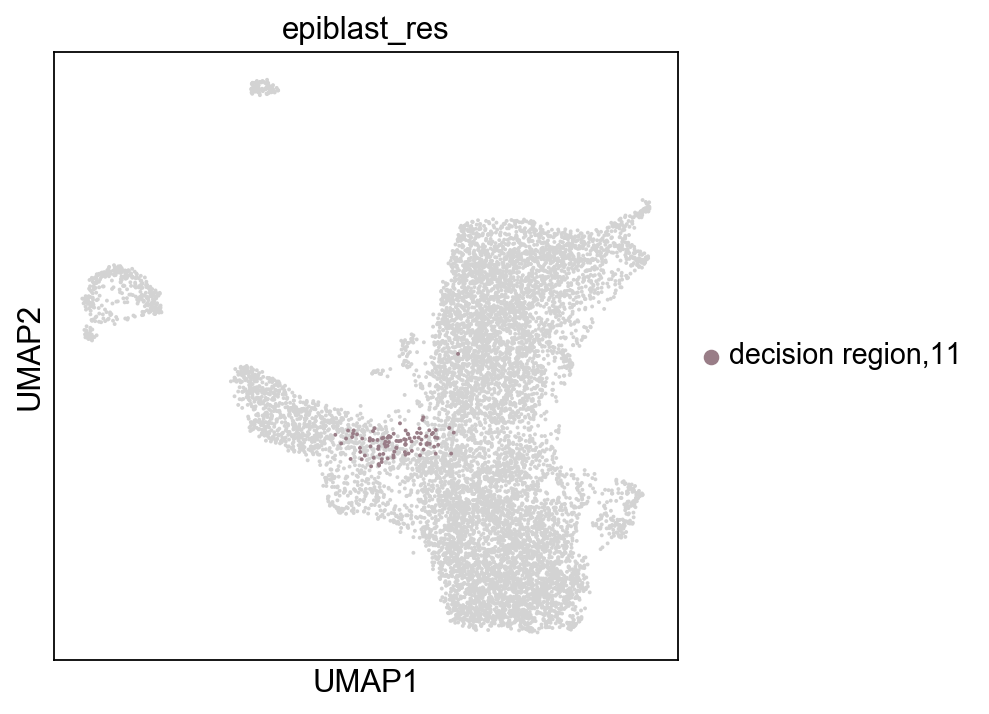

In [52]:
rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata_cor, color='epiblast_res', groups=['decision region,1', 'decision region,6', 'decision region,9',
                                        'decision region,10', 'decision region,12', 'decision region,13',
                                        'decision region,17', 'decision region,18'
                                                   ])
sc.pl.umap(adata_cor, color='epiblast_res', groups=['decision region,0', 'decision region,4', 'decision region,8'
                                                   ])
sc.pl.umap(adata_cor, color='epiblast_res', groups=['decision region,3', 'decision region,5','decision region,15', 
                                                    'decision region,16'
                                                   ])
sc.pl.umap(adata_cor, color='epiblast_res', groups=['decision region,2', 'decision region,7','decision region,14'
                                                   ])

sc.pl.umap(adata_cor, color='epiblast_res', groups=['decision region,11'
                                                   ])

Merge the clusters as subtypes of the posterior epiblast.

In [53]:
adata_cor.obs['tissues_primed'] = adata_cor.obs['tissues_merge'].cat.add_categories(['posterior epiblast 1', 
                                    'posterior epiblast 2', 'posterior epiblast 3',
                                    'posterior epiblast 4'])
adata_cor.obs['tissues_primed'][np.in1d(adata_cor.obs['epiblast_res'], 
                                       ['decision region,11'])] = 'transitory progenitors' 

adata_cor.obs['tissues_primed'][np.in1d(adata_cor.obs['epiblast_res'], 
                                       ['decision region,0', 'decision region,4', 
                                        'decision region,8'])] = 'posterior epiblast 1' 
adata_cor.obs['tissues_primed'][np.in1d(adata_cor.obs['epiblast_res'], 
                                       ['decision region,3', 'decision region,5',
                                        'decision region,15', 'decision region,16'])] = 'posterior epiblast 2' 
adata_cor.obs['tissues_primed'][np.in1d(adata_cor.obs['epiblast_res'], 
                                       ['decision region,1', 'decision region,6', 'decision region,9',
                                        'decision region,10', 'decision region,12', 'decision region,13',
                                        'decision region,17', 'decision region,18'])] = 'posterior epiblast 3'
adata_cor.obs['tissues_primed'][np.in1d(adata_cor.obs['epiblast_res'], 
                                       ['decision region,2', 'decision region,7',
                                        'decision region,14'])] = 'posterior epiblast 4' 
adata_cor.obs['tissues_primed'] = adata_cor.obs['tissues_primed'].cat.remove_unused_categories()

Reorder categories.

In [54]:
adata_cor.obs['tissues_primed'] = adata_cor.obs['tissues_primed'].cat.reorder_categories(['extraembryonic endoderm', 
             'extraembryonic ectoderm',  'anterior definitive endoderm',
       'transitory progenitors', 'axial mesendoderm', 
        'posterior epiblast 1', 'posterior epiblast 2', 'posterior epiblast 3',
       'posterior epiblast 4', 'epiblast',
        'PGC',  'paraxial mesoderm',
       'intermediate mesoderm','lateral plate mesoderm', 'nascent endothelium' ])

Adjust colors.

In [55]:
adata_cor.uns['tissues_primed_colors'] = []
adata_cor.uns['tissues_primed_colors'].append('#1f77b4') #extraembryonic endoderm
adata_cor.uns['tissues_primed_colors'].append('#ff7f0e') #extraembryonic ectoderm

adata_cor.uns['tissues_primed_colors'].append('#279e68') #anterior definitive endoderm
adata_cor.uns['tissues_primed_colors'].append('#98df8a') #endoderm progenitors

adata_cor.uns['tissues_primed_colors'].append('#17becf') #axial mesendoderm


adata_cor.uns['tissues_primed_colors'].append('#aa40fc') #posterior epiblast 1
adata_cor.uns['tissues_primed_colors'].append('#030ed3') #posterior epiblast 2
adata_cor.uns['tissues_primed_colors'].append('#198cbe') #posterior epiblast 3
adata_cor.uns['tissues_primed_colors'].append('#b7d6f6') #posterior epiblast 4

adata_cor.uns['tissues_primed_colors'].append('#ffbb78') #epiblast

adata_cor.uns['tissues_primed_colors'].append('#8c564b') #PGC

adata_cor.uns['tissues_primed_colors'].append('#e377c2') #paraxial mesoderm
adata_cor.uns['tissues_primed_colors'].append('#ff9896') #intermediate mesoderm
adata_cor.uns['tissues_primed_colors'].append('#d12e77') #lateral plate mesoderm
adata_cor.uns['tissues_primed_colors'].append('#830229') #nascent endothelium


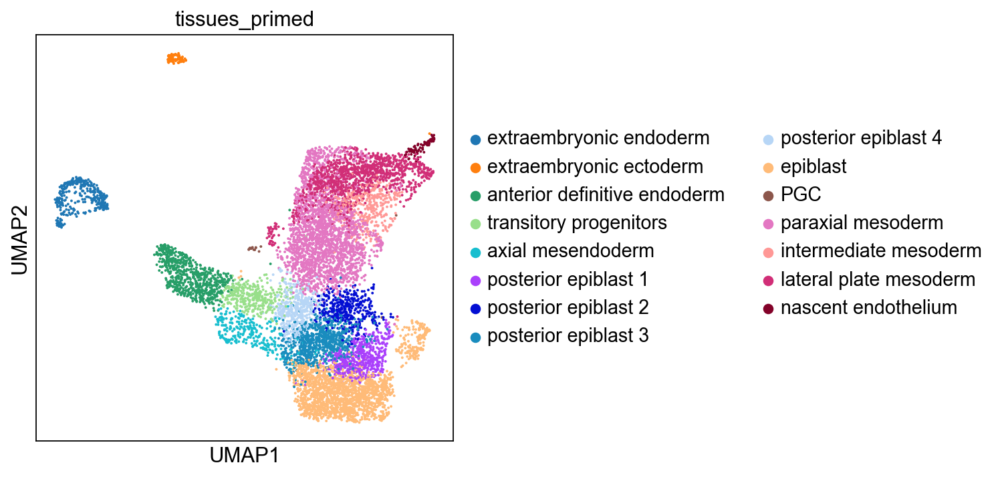

In [56]:
sc.pl.umap(adata_cor, color='tissues_primed')

Show marker genes.

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_tissues_primed']`


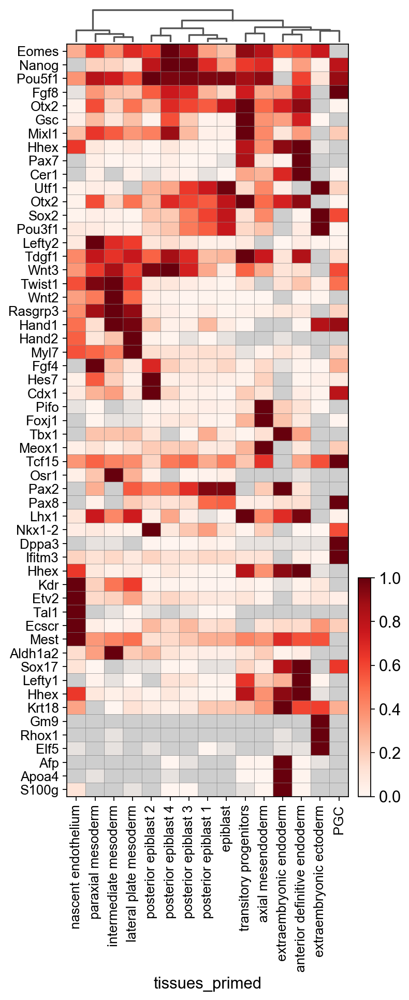

GridSpec(2, 3, height_ratios=[0.5, 11.0], width_ratios=[4.5, 0, 0.2])

In [57]:
sc.pl.matrixplot(adata_cor, use_raw=True, standard_scale='var',
                 var_names=markers, groupby='tissues_primed', cmap=mymap2, swap_axes=True, dendrogram=True)


For further investigation, we merge all posterior epiblast subtypes as 'posterior epiblast'.

In [58]:
adata_cor.obs['tissues_final'] = adata_cor.obs['tissues_primed'].cat.add_categories(['posterior epiblast'])
adata_cor.obs['tissues_final'][np.in1d(adata_cor.obs['tissues_primed'], 
                                       ['posterior epiblast 1', 'posterior epiblast 2',
                                        'posterior epiblast 3', 'posterior epiblast 4'
                                       ])] = 'posterior epiblast' 
adata_cor.obs['tissues_final'] = adata_cor.obs['tissues_final'].cat.remove_unused_categories()

Reorder categories.

In [59]:
adata_cor.obs['tissues_final'] = adata_cor.obs['tissues_final'].cat.reorder_categories(['extraembryonic endoderm', 
             'extraembryonic ectoderm',  'anterior definitive endoderm',
       'transitory progenitors', 'axial mesendoderm', 
       'posterior epiblast', 'epiblast', 
        'PGC',  'paraxial mesoderm',
       'intermediate mesoderm','lateral plate mesoderm', 'nascent endothelium' ])

Adjust colors.

In [60]:
adata_cor.uns['tissues_final_colors'] = []
adata_cor.uns['tissues_final_colors'].append('#1f77b4') #extraembryonic endoderm
adata_cor.uns['tissues_final_colors'].append('#ff7f0e') #extraembryonic ectoderm

adata_cor.uns['tissues_final_colors'].append('#279e68') #anterior definitive endoderm
adata_cor.uns['tissues_final_colors'].append('#98df8a') #endoderm progenitors

adata_cor.uns['tissues_final_colors'].append('#17becf') #axial mesendoderm
adata_cor.uns['tissues_final_colors'].append('#aa40fc') #posterior epiblast
adata_cor.uns['tissues_final_colors'].append('#ffbb78') #epiblast

adata_cor.uns['tissues_final_colors'].append('#8c564b') #PGC

adata_cor.uns['tissues_final_colors'].append('#e377c2') #paraxial mesoderm
adata_cor.uns['tissues_final_colors'].append('#ff9896') #intermediate mesoderm
adata_cor.uns['tissues_final_colors'].append('#d12e77') #lateral plate mesoderm
adata_cor.uns['tissues_final_colors'].append('#830229') #nascent endothelium


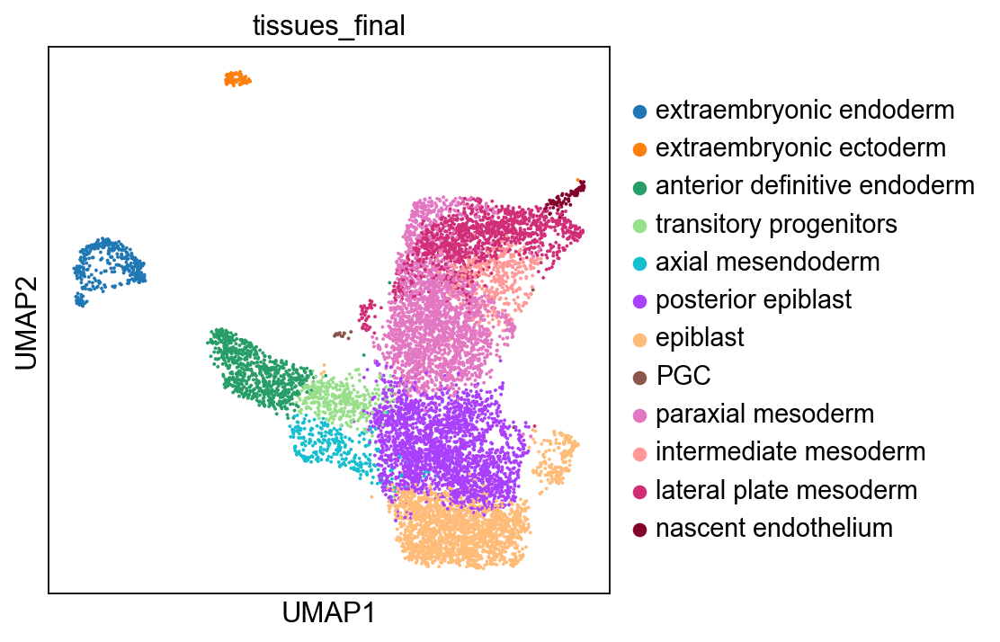

In [61]:
sc.pl.umap(adata_cor, color='tissues_final')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_tissues_final']`


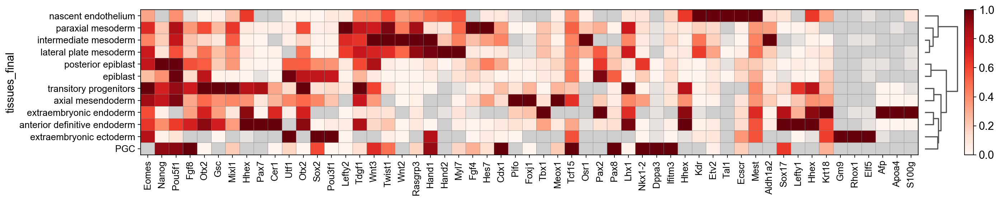

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[17.6, 0.8, 0.2])

In [62]:
rcParams['figure.figsize']=(10,10)
sc.pl.matrixplot(adata_cor, use_raw=True, standard_scale='var',
                 var_names=markers, groupby='tissues_final', 
                 cmap=mymap2, swap_axes=False, dendrogram=True)


## save annotated data to file

In [63]:
sc.write(filename='./data_annotated_dec20.h5ad', adata=adata_cor)

## Visualise annotated clusters

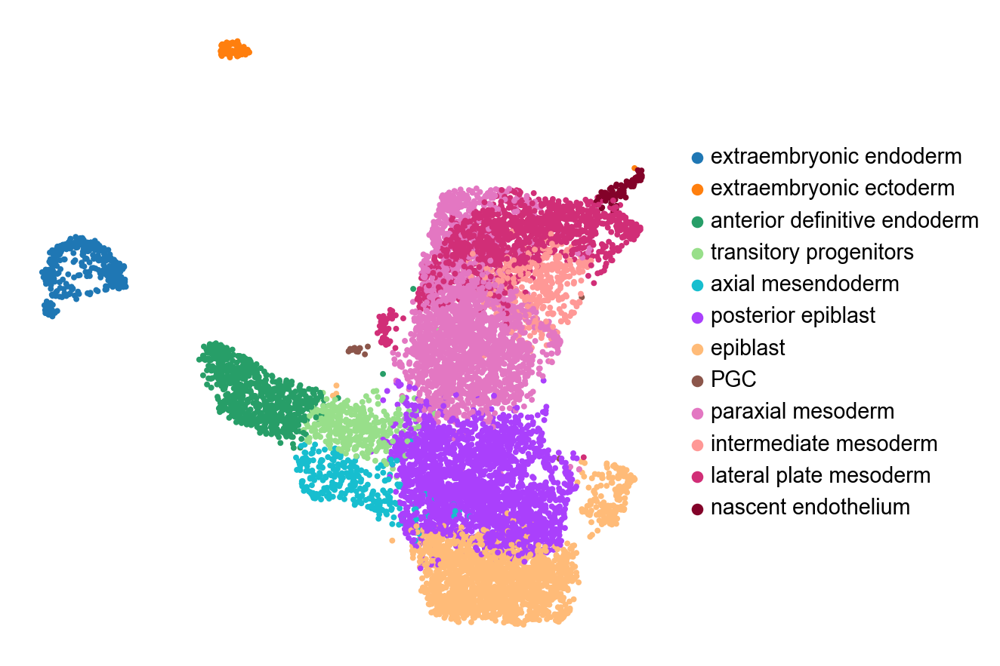

In [58]:
rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata_cor, color='tissues_final', size=50,
           frameon=False, title='',save = today + '_tissues.pdf')

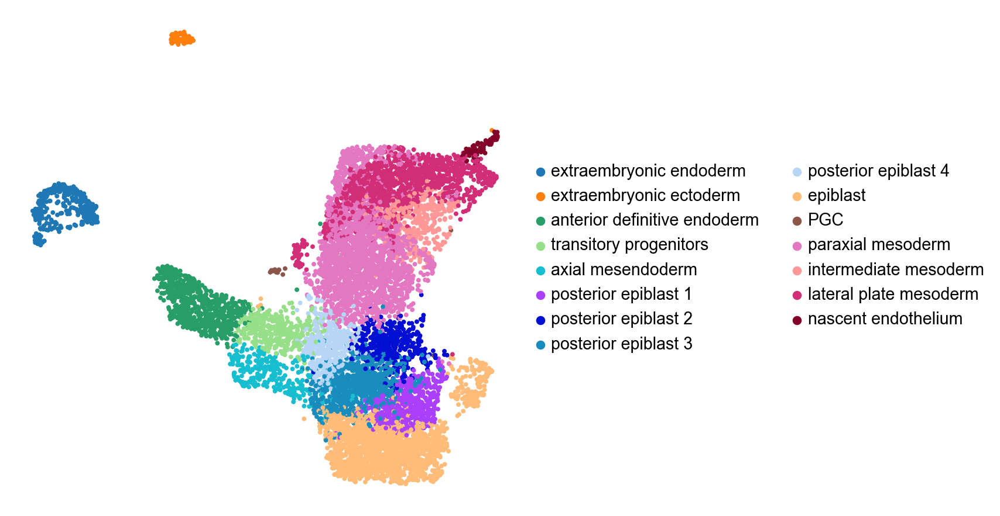

In [64]:
rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata_cor, color='tissues_primed', size=50,
           frameon=False, title='',save = today + '_tissues_p.pdf')

Visualise the marker genes.

In [65]:
markers = {}
markers['ectoderm']=['Gata3', 'Tfap2a', 'Dlx5']
markers['epiblast']=['Utf1', #epiblast
              'Otx2','Sox2','Pou3f1', # anterior epiblast
              'Tdgf1','Wnt3', 'Wnt8a' # posterior epiblast
        ]
markers['mesoderm']=['Pdgfra', 'Mesp1',
                    'Pifo','Foxj1', #axial mesendoderm
                     'Tbx1', 'Meox1', 'Tcf15',#paraxial mesoderm
                     'Osr1', 'Pax2', 'Pax8', 'Lhx1', #intermediate mesoderm
                     'T', 
                     'Etv2', 'Tal1'] #nascent endothelium markers

markers['transitory progenitors'] =[
'Pax7', 'Pga5','Srgn', 'Cer1']
markers['endoderm']=[
         'Foxa2',
         'Sox17','Lefty1','Hhex','Krt18', #endoderm 
        ]

markers['Extraembryonic'] = ['Gm9','Rhox1','Elf5', #extraembryonic ectoderm
         'Afp','Apoa4','S100g' #extraembryonic endoderm
              ]

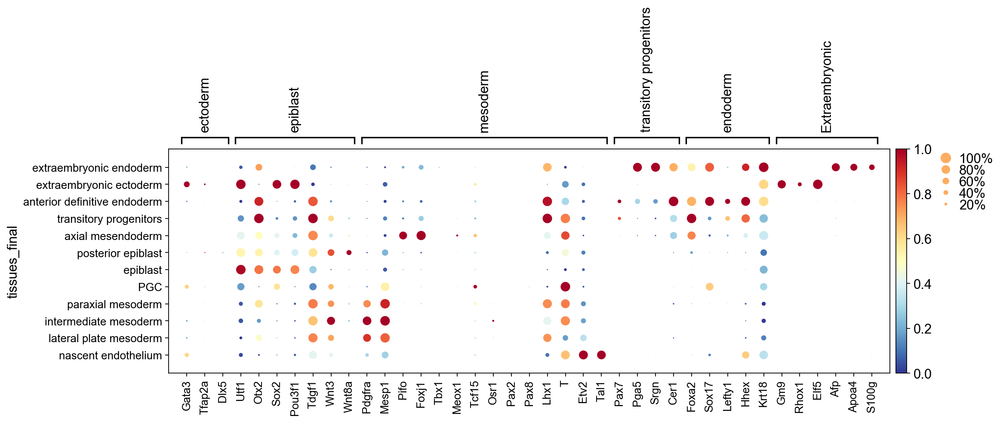

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[13.649999999999999, 0, 0.2, 0.5, 0.25])

In [66]:
sc.pl.dotplot(adata_cor, groupby='tissues_final', 
              var_names=markers, use_raw=True, 
              color_map='RdYlBu_r', standard_scale='var')

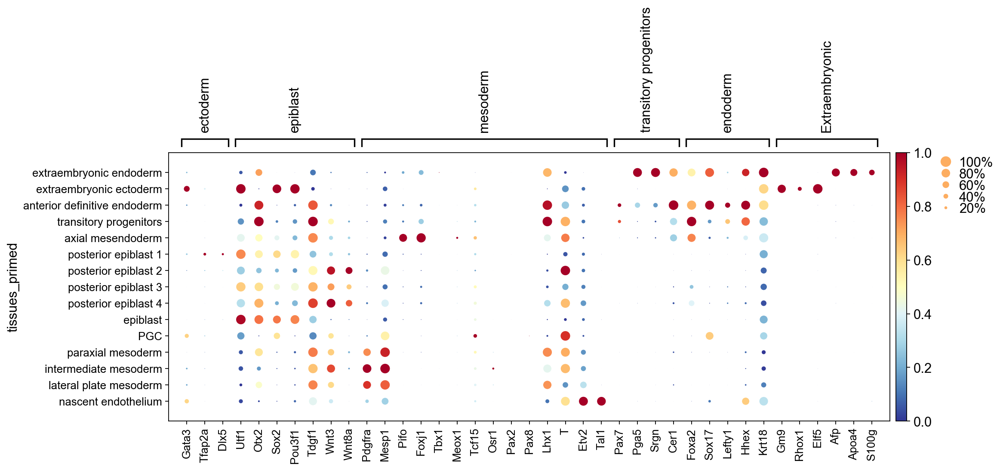

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[13.649999999999999, 0, 0.2, 0.5, 0.25])

In [67]:
sc.pl.dotplot(adata_cor, groupby='tissues_primed', 
              var_names=markers, use_raw=True, 
              color_map='RdYlBu_r', standard_scale='var')

## Barplot for FVF sorting per tissue

Show the contribution of the FVF sorting per tissue.

In [68]:
df1 = pd.crosstab(adata_cor.obs['tissues_final'],adata_cor.obs['FVF'], normalize=0)*100

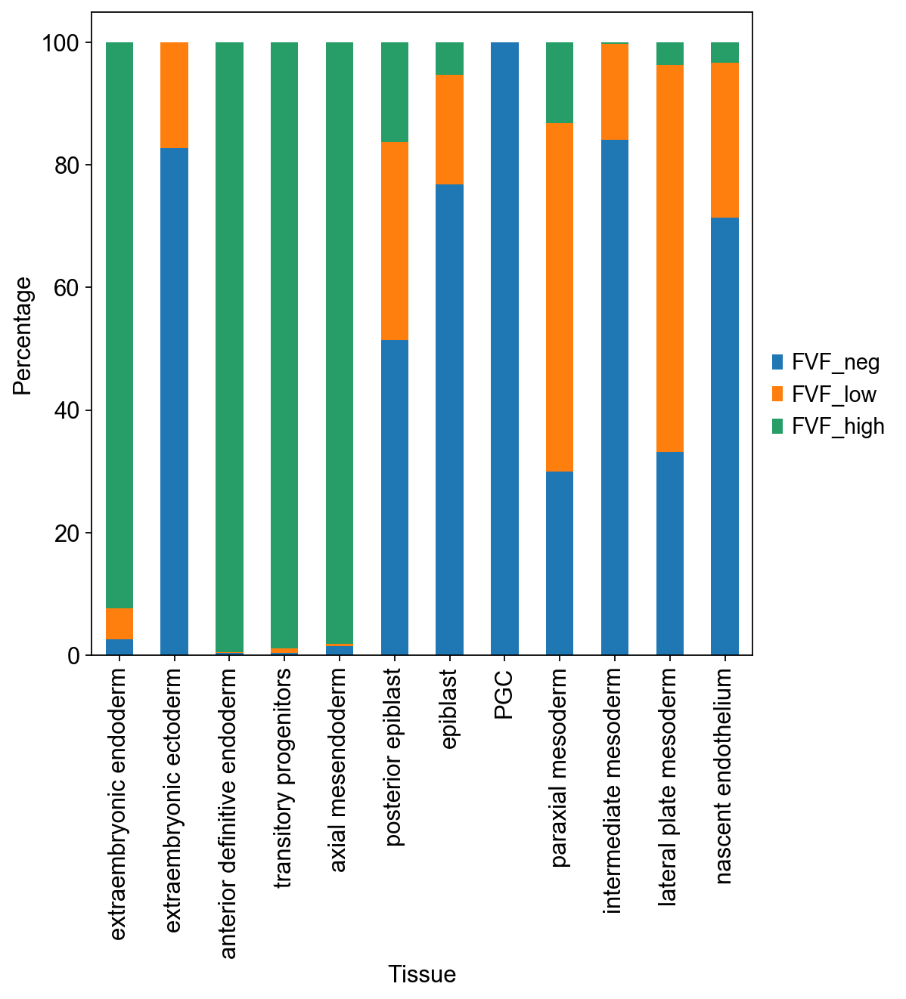

In [69]:
d = df1.plot(kind='bar',stacked=True,legend=False)
pl.grid(b=None)
d.set_ylabel('Percentage')
d.set_xlabel('Tissue')
pl.legend(bbox_to_anchor=(1, 0.5), frameon=False)
pl.savefig('./figures/barplot_'+ today + '_FVF.pdf', bbox_inches = 'tight')
pl.show()

Resolved decision region.

In [70]:
df1 = pd.crosstab(adata_cor.obs['tissues_primed'],adata_cor.obs['FVF'], normalize=0)*100

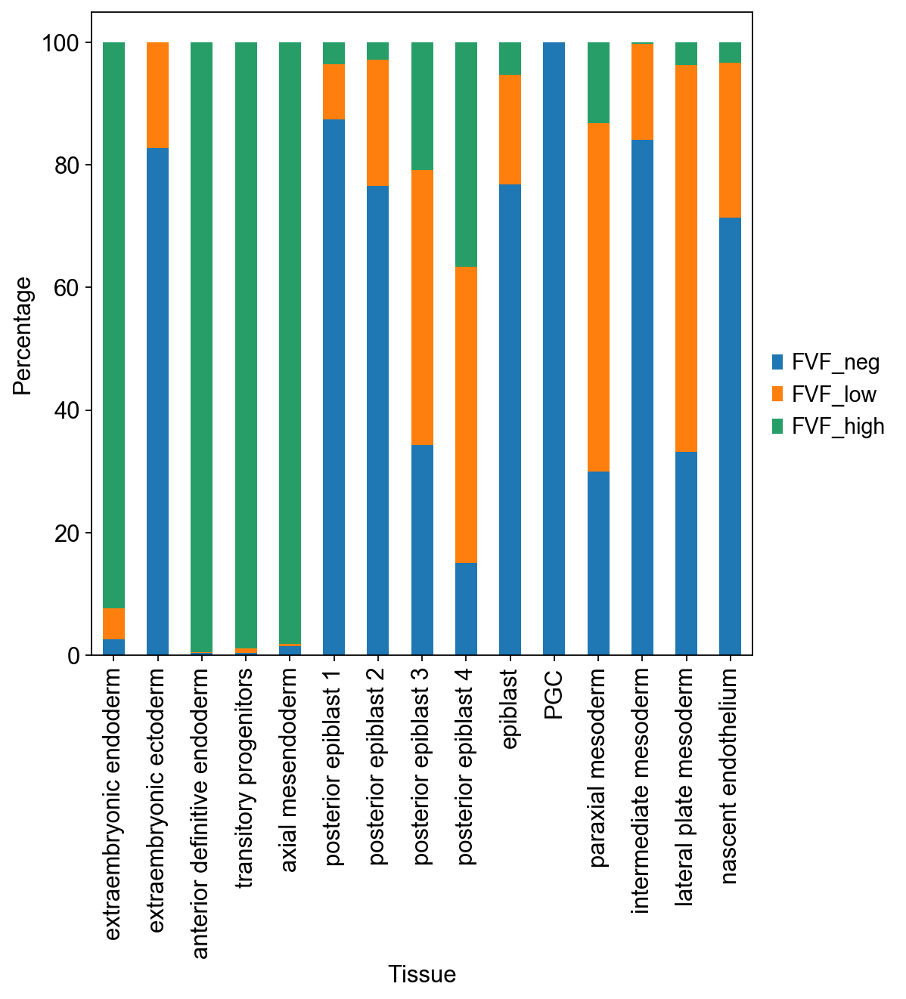

In [71]:
d = df1.plot(kind='bar',stacked=True,legend=False)
pl.grid(b=None)
d.set_ylabel('Percentage')
d.set_xlabel('Tissue')
pl.legend(bbox_to_anchor=(1, 0.5), frameon=False)
pl.savefig('./figures/barplot_'+ today + '_FVF_p.pdf', bbox_inches = 'tight')
pl.show()